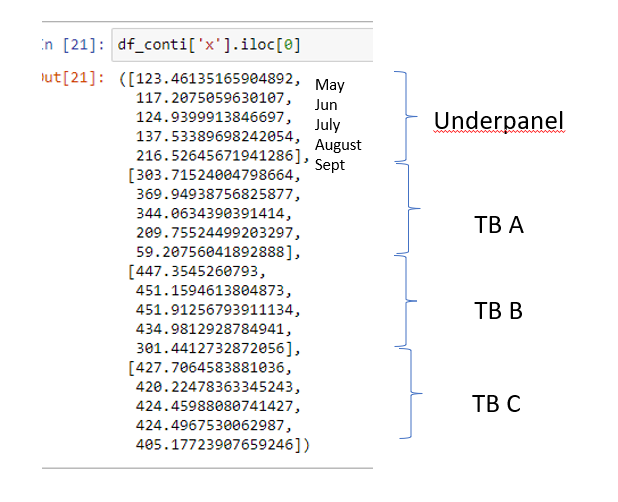


In [1]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon
from pyproj import CRS
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt
import numpy as np

In [2]:
# import the United States shape file
states = gpd.read_file('tl_2022_us_state/tl_2022_us_state.shp')
#states = states.to_crs("EPSG:5070")

# set state code as index, exclude states that we will never display
states = states.set_index('STUSPS').drop(index=['PR', 'VI', 'MP', 'GU', 'AS'])

conti = states.drop(index=['HI', 'AK'])
conti = conti.to_crs("EPSG:5070")

alaska = states.loc[['AK']]
hawaii = states.loc[['HI']]

In [3]:
mypath = 'HPCFiles/dist_res'
pkl_list = [f for f in listdir(mypath) if isfile(join(mypath, f)) and f.endswith('pkl')]
conti_list = [f for f in pkl_list if f.split('_')[-1].split('.')[0] not in ['USA', 'Alaska', 'Hawaii']]

df_conti2 = pd.read_pickle(join(mypath, conti_list[0]))

for pkl in conti_list[1:]:
    df = pd.read_pickle(join(mypath, pkl))
    df_conti2 = pd.concat([df_conti2, df],axis=0)

#df_conti2 = pd.to_pickle(join(mypath, 'res_dist_USA.pkl'))
df_alaska2 = pd.read_pickle(join(mypath, 'res_dist_Alaska.pkl'))    
df_hawaii2 = pd.read_pickle(join(mypath, 'res_dist_Hawaii.pkl'))

C:\Users\sayala\AppData\Local\Temp\1\ipykernel_1200\974448156.py:62: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(4,4))


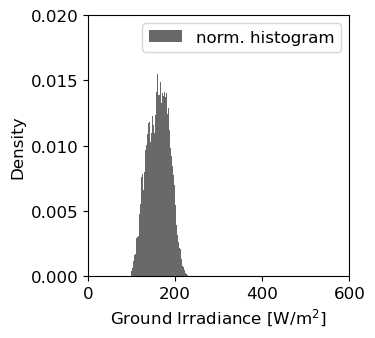

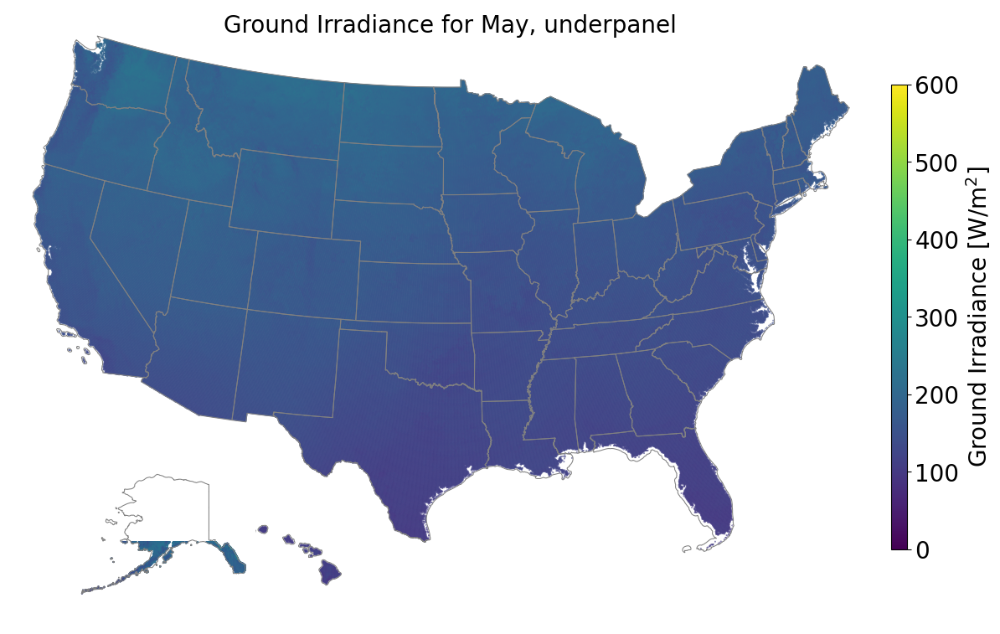

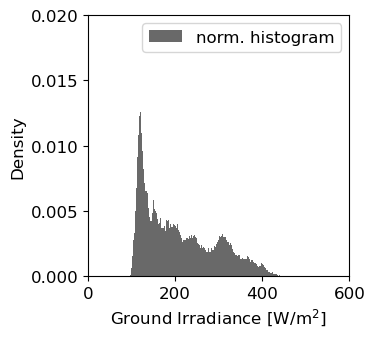

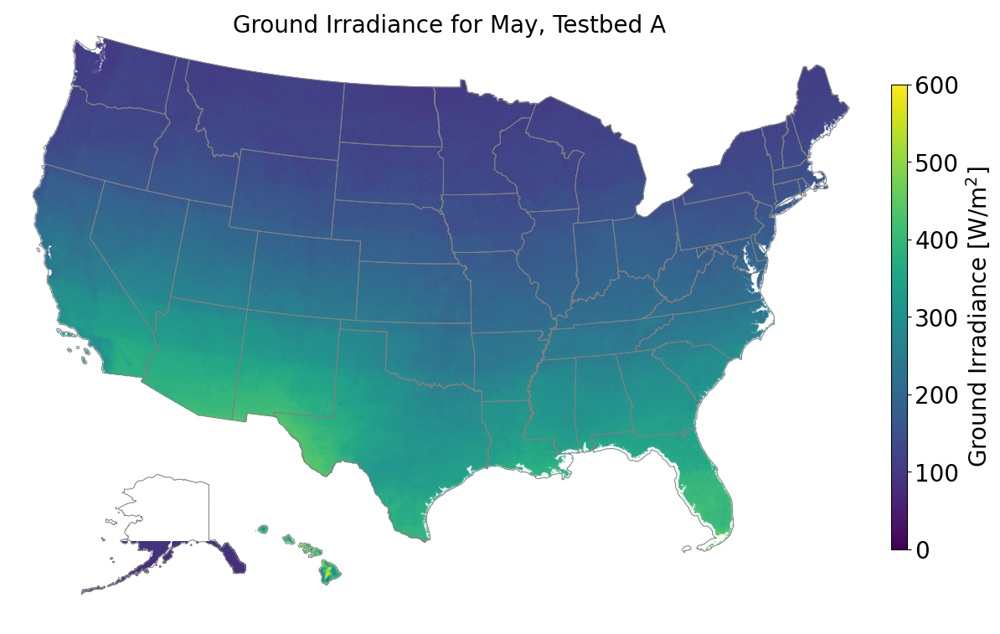

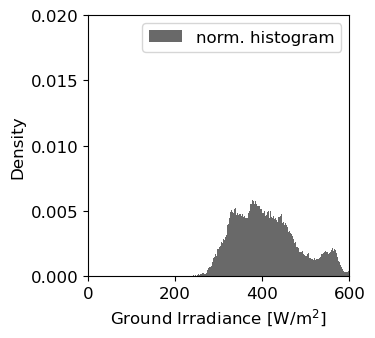

...

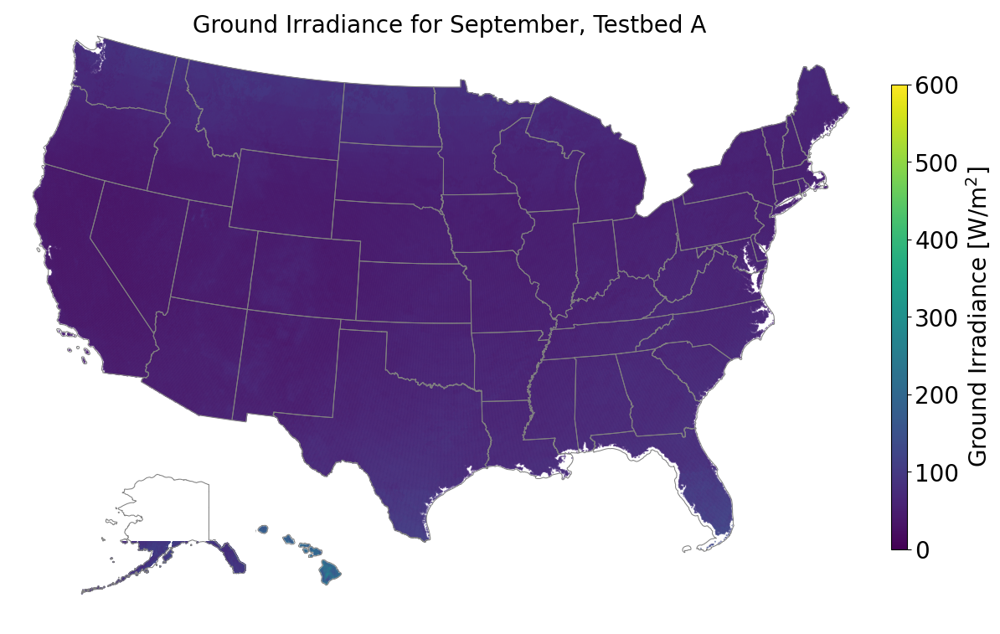

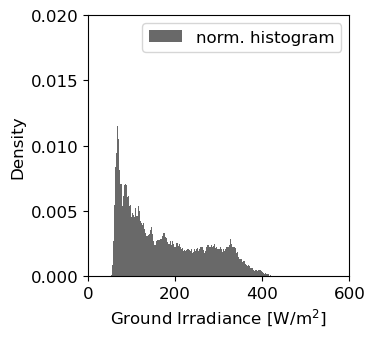

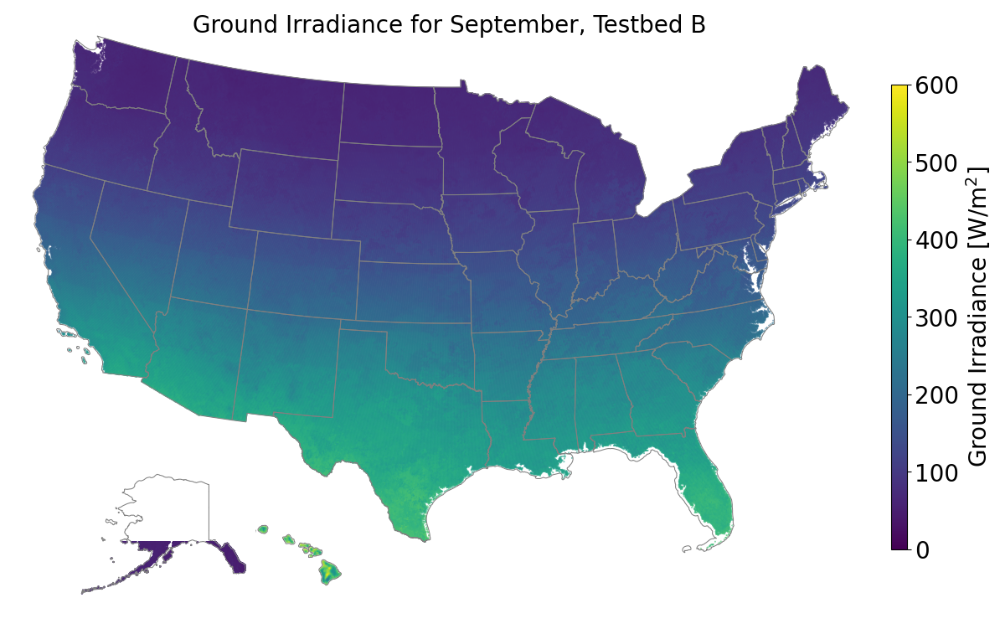

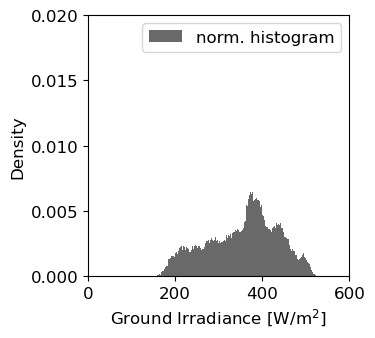

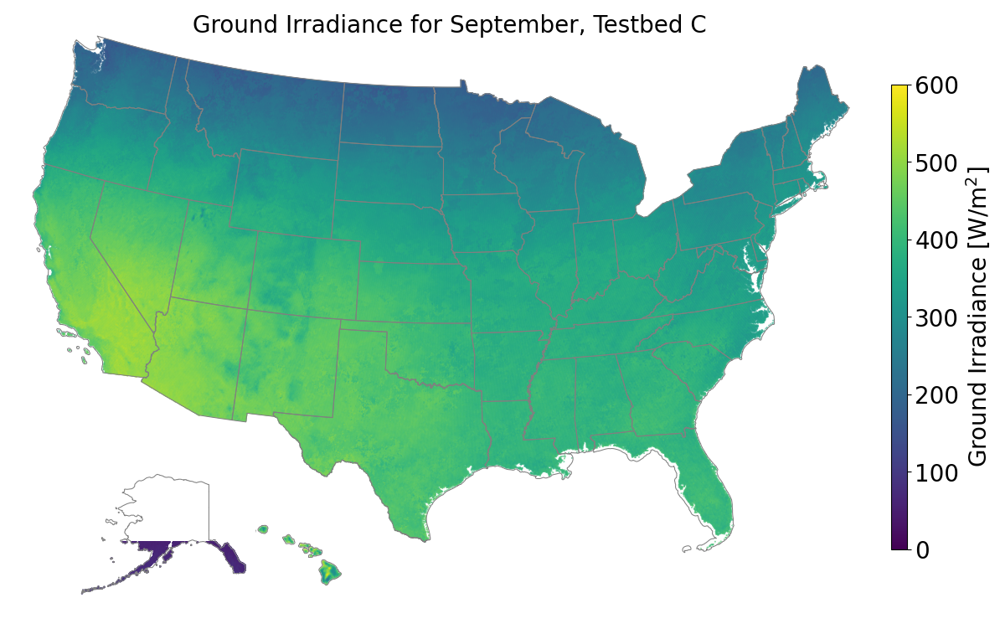

In [6]:
for mmonth in range(0,5):
    for testbed in range(0,4):
        poswanted_conti = []
        poswanted_hawaii = []
        poswanted_alaska = []
        #mmonth = 1 # 0 - May, 1 - June, 2 - July, 3 - August, 4 - September
        #testbed = 3 # 0 - underpanel, 1 - TBA, 2 - TBB, 3 - TBC

        if testbed == 0:
            testbedname = 'underpanel'
        if testbed == 1:
            testbedname = 'Testbed A'
        if testbed == 2:
            testbedname = 'Testbed B'
        if testbed == 3:
            testbedname = 'Testbed C'
        
        if mmonth == 0:
            mmonthname = 'May'
        if mmonth == 1:
            mmonthname = 'June'
        if mmonth == 2:
            mmonthname = 'July'
        if mmonth == 3:
            mmonthname = 'August'
        if mmonth == 4:
            mmonthname = 'September'
            
        for ii in range(0, len(df_conti2)):
            poswanted_conti.append(df_conti2['x'].iloc[ii][testbed][mmonth]) # May undertestbed)

        for ii in range(0, len(df_alaska2)):
            poswanted_alaska.append(df_alaska2['x'].iloc[ii][testbed][mmonth]) # May undertestbed)

        for ii in range(0, len(df_hawaii2)):
            poswanted_hawaii.append(df_hawaii2['x'].iloc[ii][testbed][mmonth]) # May undertestbed)
    
    
    
        df_conti = df_conti2[['latitude', 'longitude']]
        df_alaska = df_alaska2[['latitude', 'longitude']]
        df_hawaii = df_hawaii2[['latitude', 'longitude']]
        
        df_conti['x'] = poswanted_conti
        df_alaska['x'] = poswanted_alaska
        df_hawaii['x'] = poswanted_hawaii
        
        geo_conti = gpd.GeoDataFrame(df_conti['x'], 
                 geometry = [Point(xy) for xy in zip(df_conti['longitude'], df_conti['latitude'])],
                 crs = CRS('EPSG:4326')).to_crs(conti.crs)

        geo_alaska = gpd.GeoDataFrame(df_alaska['x'], 
                         geometry = [Point(xy) for xy in zip(df_alaska['longitude'], df_alaska['latitude'])],
                         crs = CRS('EPSG:4326')).to_crs(alaska.crs)

        geo_hawaii = gpd.GeoDataFrame(df_hawaii['x'], 
                         geometry = [Point(xy) for xy in zip(df_hawaii['longitude'], df_hawaii['latitude'])],
                         crs = CRS('EPSG:4326')).to_crs(hawaii.crs)
        
        plt.rcParams.update({'font.size': 12})
        
        fig, ax = plt.subplots(figsize=(4,4))
        geo_conti['x'].plot.hist(bins=1000, density=True, color='dimgray', label='norm. histogram')

        ax.legend()

        for rect in ax.patches:
            if rect.get_x() < 0.0:
                rect.set_color('firebrick')

        #ax.set_xlim(-2.5, 16)
        #ax.set_ylim(0, 0.225)
        ax.set_xlabel('Ground Irradiance [W/m$^2$]')
        ax.set_ylabel('Density')
        ax.set_box_aspect(1)
        ax.set_ylim(0, 0.02)
        ax.set_xlim(0,600)
        plt.tight_layout()
        hist_titlepng = 'USA_hist_'+mmonthname+'_'+testbedname+'.png'
        hist_titlejpg = 'USA_hist_'+mmonthname+'_'+testbedname+'.pdf'

        plt.savefig(hist_titlepng, dpi=600)
        plt.savefig(hist_titlejpg)
        
        plt.rcParams.update({'font.size': 20})
        
        
        # create an axis with 2 insets − this defines the inset sizes
        fig, continental_ax = plt.subplots(figsize=(13, 8))
        alaska_ax = continental_ax.inset_axes([.08, .01, .20, .28])
        hawaii_ax = continental_ax.inset_axes([.28, .05, .1, .132])


        # Set bounds to fit desired areas in each plot
        continental_ax.set_xlim(-2.5E6, 2.5E6)
        #continental_ax.set_ylim(22, 53)
        continental_ax.axis('off')

        alaska_ax.set_ylim(51, 72)
        alaska_ax.set_xlim(-180, -127)
        alaska_ax.axis('off')

        hawaii_ax.set_ylim(18.8, 22.5)
        hawaii_ax.set_xlim(-160, -154.6)
        hawaii_ax.axis('off')

        # Plot the data per area - requires passing the same choropleth parameters to each call
        # because different data is used in each call, so automatically setting bounds won’t work

        vmin = 0.0
        vmax = 600.0

        bound_plot = {'color':'gray', 'lw':0.75 }

        conti.boundary.plot(ax=continental_ax, **bound_plot)
        alaska.boundary.plot(ax=alaska_ax, **bound_plot)
        hawaii.boundary.plot(ax=hawaii_ax, **bound_plot)

        cont_plot = {'column':'x', 'cmap':'viridis', 'vmin':vmin, 'vmax':vmax, 'marker':'o', 'markersize':0.1} #
        legend_kwds={'shrink':0.75, 'drawedges':False, 'label':'Ground Irradiance [W/m$^2$]', #'ticks': np.linspace(0,15, 16), 
                     'pad':0, 'aspect':30}

        geo_conti.plot(ax=continental_ax, legend=True, legend_kwds=legend_kwds, **cont_plot)
        geo_alaska.plot(ax=alaska_ax, **cont_plot)
        geo_hawaii.plot(ax=hawaii_ax,  **cont_plot)

        myplottitle = 'Ground Irradiance for '+ mmonthname +', '+ testbedname
        continental_ax.set_title(myplottitle, fontsize=20, y=0.95)

        plt.tight_layout()
        
        map_titlepng = 'USA_map_'+mmonthname+'_'+testbedname+'.png'

        plt.savefig(map_titlepng, dpi=600)